In [1]:
import os
from dotenv import load_dotenv
load_dotenv()

import scipy
import numpy as np
import pandas as pd
from mysql.connector import connect

import matplotlib.pyplot as plt
%matplotlib inline

import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go
from plotly.subplots import make_subplots

C:\Users\paxom\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


In [2]:
import warnings
warnings.simplefilter('ignore')

In [3]:
DB_HOST = os.getenv("DB_HOST")
DB_DATABASE = os.getenv("DB_DATABASE")
DB_LOGIN = os.getenv("DB_LOGIN")
DB_PASSWORD = os.getenv("DB_PASSWORD")

In [4]:
conn_data = connect(host=DB_HOST,
                    user=DB_LOGIN,
                    password=DB_PASSWORD,
                    database=DB_DATABASE)
cur_data = conn_data.cursor()

## Load data

In [5]:
ethusdt_spot_1h = pd.read_sql('''SELECT * 
                                 FROM data.ethusdt_spot_1h
                                 WHERE openTime >= CAST('2022-01-06 00:00:00' AS datetime)''', con=conn_data)
ethusdt_spot_1h.head()

,openTime,open,high,low,close,volume
0,2022-01-06 00:00:00,3593.13,3633.96,3553.00,3554.24,28173.2
1,2022-01-06 01:00:00,3554.24,3570.36,3415.00,3534.25,65658.8
2,2022-01-06 02:00:00,3534.25,3564.98,3503.18,3540.63,26507.9
3,2022-01-06 03:00:00,3539.82,3550.43,3516.00,3538.85,19668.9
4,2022-01-06 04:00:00,3538.85,3540.00,3501.83,3525.13,15755.3


In [6]:
ethusdt_futures_1h = pd.read_sql('''SELECT * 
                                    FROM data.ethusdt_futures_1h
                                    WHERE openTime >= CAST('2022-01-06 00:00:00' AS datetime)''', con=conn_data)
ethusdt_futures_1h.head()

,openTime,open,high,low,close,volume
0,2022-01-06 00:00:00,3592.31,3633.38,3551.00,3552.76,140851.0
1,2022-01-06 01:00:00,3552.76,3569.72,3405.00,3532.65,299953.0
2,2022-01-06 02:00:00,3532.65,3562.26,3501.54,3537.71,100927.0
3,2022-01-06 03:00:00,3537.81,3549.11,3513.96,3536.44,72700.4
4,2022-01-06 04:00:00,3536.45,3538.57,3501.00,3523.46,50959.0


In [7]:
ethusdt_spot_1h.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8658 entries, 0 to 8657
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   openTime  8658 non-null   datetime64[ns]
 1   open      8658 non-null   float64       
 2   high      8658 non-null   float64       
 3   low       8658 non-null   float64       
 4   close     8658 non-null   float64       
 5   volume    8658 non-null   float64       
dtypes: datetime64[ns](1), float64(5)
memory usage: 406.0 KB


In [8]:
ethusdt_futures_1h.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8658 entries, 0 to 8657
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   openTime  8658 non-null   datetime64[ns]
 1   open      8658 non-null   float64       
 2   high      8658 non-null   float64       
 3   low       8658 non-null   float64       
 4   close     8658 non-null   float64       
 5   volume    8658 non-null   float64       
dtypes: datetime64[ns](1), float64(5)
memory usage: 406.0 KB


In [9]:
ethusdt_fundrates = pd.read_sql('''SELECT * 
                                   FROM data.ethusdt_fundrates
                                   WHERE fundingTime >= CAST('2022-01-06 00:00:00' AS datetime)''', con=conn_data)
ethusdt_fundrates.head()

,fundingTime,fundingRate,symbol
0,2022-01-06 03:00:00,0.000054,ETHUSDT
1,2022-01-06 11:00:00,0.000100,ETHUSDT
2,2022-01-06 19:00:00,0.000043,ETHUSDT
3,2022-01-07 03:00:00,0.000019,ETHUSDT
4,2022-01-07 11:00:00,0.000100,ETHUSDT


In [10]:
ethusdt_fundrates.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1083 entries, 0 to 1082
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   fundingTime  1083 non-null   datetime64[ns]
 1   fundingRate  1083 non-null   float64       
 2   symbol       1083 non-null   object        
dtypes: datetime64[ns](1), float64(1), object(1)
memory usage: 25.5+ KB


## Plots

In [11]:
# Create traces
fig = go.Figure()

fig.add_trace(go.Scatter(x=ethusdt_spot_1h['openTime'], y=ethusdt_spot_1h['close'],
                    mode='lines',
                    name='ETHUSDT SPOT 1h Close'))
fig.add_trace(go.Scatter(x=ethusdt_futures_1h['openTime'], y=ethusdt_futures_1h['close'],
                    mode='lines',
                    name='ETHUSDT FUTURES 1h Close'))
fig.add_trace(go.Scatter(x=ethusdt_fundrates['fundingTime'], y=ethusdt_fundrates['fundingRate'],
                    mode='lines',
                    name='ETHUSDT Funding Rate'))

fig.update_layout(
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=-0.15,
        xanchor="right",
        x=1)
)

fig.show()

In [12]:
stats = ethusdt_spot_1h[['open', 'high', 'low', 'close']].describe().reset_index()
stats.loc[len(stats.index)] = ['skew'] + list(scipy.stats.skew(ethusdt_spot_1h[['open', 'high', 'low', 'close']], axis=0, bias=True))
stats.loc[len(stats.index)] = ['kurtosis'] + list(scipy.stats.kurtosis(ethusdt_spot_1h[['open', 'high', 'low', 'close']], axis=0, bias=True))
stats.set_index('index')

,open,high,low,close
index,,,,
count,8658.000000,8658.000000,8658.000000,8658.000000
mean,1966.414571,1978.291899,1954.019806,1966.137424
std,753.484433,757.025506,749.422016,753.314996
min,904.260000,928.360000,881.560000,904.250000
25%,1291.972500,1297.705000,1286.252500,1291.952500
50%,1672.350000,1683.385000,1663.310000,1671.405000
75%,2728.367500,2744.887500,2707.820000,2728.110000
max,3593.130000,3633.960000,3553.000000,3554.240000
skew,0.544457,0.540467,0.548090,0.544643


In [13]:
fig = ff.create_distplot([ethusdt_spot_1h['close'].to_list()], group_labels=['distplot'])
fig.show()

In [14]:
stats = ethusdt_futures_1h[['open', 'high', 'low', 'close']].describe().reset_index()
stats.loc[len(stats.index)] = ['skew'] + list(scipy.stats.skew(ethusdt_futures_1h[['open', 'high', 'low', 'close']], axis=0, bias=True))
stats.loc[len(stats.index)] = ['kurtosis'] + list(scipy.stats.kurtosis(ethusdt_futures_1h[['open', 'high', 'low', 'close']], axis=0, bias=True))
stats.set_index('index')

,open,high,low,close
index,,,,
count,8658.000000,8658.000000,8658.000000,8658.000000
mean,1965.548326,1977.755683,1952.892251,1965.268996
std,753.190062,756.775125,749.155537,753.040859
min,903.260000,928.000000,878.040000,903.260000
25%,1291.255000,1297.432500,1285.025000,1291.122500
50%,1671.205000,1682.945000,1662.625000,1670.500000
75%,2727.040000,2744.380000,2705.847500,2726.937500
max,3592.310000,3633.380000,3551.000000,3552.760000
skew,0.544499,0.540384,0.548222,0.544658


In [15]:
fig = ff.create_distplot([ethusdt_futures_1h['close'].to_list()], group_labels=['distplot'])
fig.show()

In [16]:
# Create traces
fig = go.Figure(data=go.Scatter(x=ethusdt_fundrates['fundingTime'], y=ethusdt_fundrates['fundingRate'],
                    mode='lines',
                    name='ETHUSDT Funding Rate'))

fig.update_layout(
    showlegend=True,
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=-0.15,
        xanchor="right",
        x=1)
)

fig.show()

In [17]:
fig = px.box(ethusdt_fundrates, y="fundingRate")
fig.show()

In [18]:
stats = ethusdt_fundrates[['fundingRate']].describe().reset_index()
stats.loc[len(stats.index)] = ['skew'] + list(scipy.stats.skew(ethusdt_fundrates[['fundingRate']], axis=0, bias=True))
stats.loc[len(stats.index)] = ['kurtosis'] + list(scipy.stats.kurtosis(ethusdt_fundrates[['fundingRate']], axis=0, bias=True))
stats.set_index('index')

,fundingRate
index,
count,1083.000000
mean,0.000006
std,0.000170
min,-0.003019
25%,-0.000028
50%,0.000038
75%,0.000100
max,0.000100
skew,-9.846709


In [19]:
all_df = ethusdt_spot_1h[['openTime', 'open', 'high', 'low', 'close']].merge(
    ethusdt_futures_1h[['openTime', 'open', 'high', 'low', 'close']], 
    on='openTime', suffixes=('_spot', '_futures'))

In [20]:
all_df = all_df.merge(ethusdt_fundrates.rename(columns={'fundingTime': 'openTime'}),
                      on='openTime', how='left')

In [21]:
all_df['fundingRate'] = all_df['fundingRate'].fillna(method='ffill')

In [22]:
corr = all_df.corr()

In [23]:
corr.style.background_gradient(cmap='coolwarm')

,open_spot,high_spot,low_spot,close_spot,open_futures,high_futures,low_futures,close_futures,fundingRate
open_spot,1.000000,0.999839,0.999808,0.999710,1.000000,0.999829,0.999796,0.999710,0.118919
high_spot,0.999839,1.000000,0.999704,0.999841,0.999838,0.999998,0.999691,0.999841,0.117872
low_spot,0.999808,0.999704,1.000000,0.999852,0.999808,0.999695,0.999998,0.999853,0.120203
close_spot,0.999710,0.999841,0.999852,1.000000,0.999709,0.999838,0.999848,1.000000,0.118932
open_futures,1.000000,0.999838,0.999808,0.999709,1.000000,0.999828,0.999797,0.999709,0.119329
high_futures,0.999829,0.999998,0.999695,0.999838,0.999828,1.000000,0.999683,0.999838,0.118287
low_futures,0.999796,0.999691,0.999998,0.999848,0.999797,0.999683,1.000000,0.999849,0.120649
close_futures,0.999710,0.999841,0.999853,1.000000,0.999709,0.999838,0.999849,1.000000,0.119326
fundingRate,0.118919,0.117872,0.120203,0.118932,0.119329,0.118287,0.120649,0.119326,1.000000


In [24]:
# Create a subplot with two rows and one column
fig = make_subplots(rows=2, cols=1, shared_xaxes=False, vertical_spacing=0.15, row_heights=[0.7, 0.3])

# Create bar chart for stock price distribution
price_bars = go.Figure(data=[
    go.Histogram(x=ethusdt_spot_1h['open'], name='Open', marker_color='blue'),
    go.Histogram(x=ethusdt_spot_1h['high'], name='High', marker_color='green'),
    go.Histogram(x=ethusdt_spot_1h['low'], name='Low', marker_color='red'),
    go.Histogram(x=ethusdt_spot_1h['close'], name='Close', marker_color='purple')
])

# Create bar chart for volume distribution
volume_bar = go.Histogram(
    x=ethusdt_spot_1h['volume'],
    name="Volume Distribution",
    marker_color="blue"
)

# Add stock price bar chart to the first row
fig.add_trace(price_bars['data'][0], row=1, col=1)
fig.add_trace(price_bars['data'][1], row=1, col=1)
fig.add_trace(price_bars['data'][2], row=1, col=1)
fig.add_trace(price_bars['data'][3], row=1, col=1)

# Add volume bar chart to the second row
fig.add_trace(volume_bar, row=2, col=1)

# Update axis labels and titles
fig.update_yaxes(title_text="Count", row=1, col=1)
fig.update_xaxes(title_text="Price", row=1, col=1)
fig.update_yaxes(title_text="Count", row=2, col=1)
fig.update_xaxes(title_text="Volume", row=2, col=1)
fig.update_layout(
    title_text="Spot Price and Volume Distribution",
    xaxis_rangeslider_visible=False,
    height=550
)

# Show the chart
fig.show()

In [25]:
# Create a subplot with two rows and one column
fig = make_subplots(rows=2, cols=1, shared_xaxes=False, vertical_spacing=0.15, row_heights=[0.7, 0.3])

# Create bar chart for stock price distribution
price_bars = go.Figure(data=[
    go.Histogram(x=ethusdt_futures_1h['open'], name='Open', marker_color='blue'),
    go.Histogram(x=ethusdt_futures_1h['high'], name='High', marker_color='green'),
    go.Histogram(x=ethusdt_futures_1h['low'], name='Low', marker_color='red'),
    go.Histogram(x=ethusdt_futures_1h['close'], name='Close', marker_color='purple')
])

# Create bar chart for volume distribution
volume_bar = go.Histogram(
    x=ethusdt_futures_1h['volume'],
    name="Volume Distribution",
    marker_color="blue"
)

# Add stock price bar chart to the first row
fig.add_trace(price_bars['data'][0], row=1, col=1)
fig.add_trace(price_bars['data'][1], row=1, col=1)
fig.add_trace(price_bars['data'][2], row=1, col=1)
fig.add_trace(price_bars['data'][3], row=1, col=1)

# Add volume bar chart to the second row
fig.add_trace(volume_bar, row=2, col=1)

# Update axis labels and titles
fig.update_yaxes(title_text="Count", row=1, col=1)
fig.update_xaxes(title_text="Price", row=1, col=1)
fig.update_yaxes(title_text="Count", row=2, col=1)
fig.update_xaxes(title_text="Volume", row=2, col=1)
fig.update_layout(
    title_text="Futures Price and Volume Distribution",
    xaxis_rangeslider_visible=False,
    height=550
)

# Show the chart
fig.show()

In [26]:
fig = go.Figure()

fig.add_trace(go.Histogram(
    x=ethusdt_fundrates['fundingRate'],
    xbins=dict(start=min(ethusdt_fundrates['fundingRate']), 
               end=max(ethusdt_fundrates['fundingRate']), 
               size=0.00003),  # Adjust bin size as needed
    marker_color='blue',
    opacity=0.7,
    name='Funding Rates'
))

# Customize the layout
fig.update_layout(
    title='Funding Rates Distribution',
    xaxis_title='Funding Rate',
    yaxis_title='Frequency',
)

# Show the plot
fig.show()

In [27]:
ethusdt_fundrates['Value'] = ethusdt_fundrates['fundingRate'].apply(lambda x: 'Positive' if x > 0 else ('Negative' if x < 0 else 'Equal'))

In [28]:
ethusdt_fundrates['Value'].value_counts()

Positive    709
Negative    374
Name: Value, dtype: int64

## Trading on indicators strategies

In [29]:
ethusdt_spot_1h = ethusdt_spot_1h.set_index('openTime')
ethusdt_spot_1h.index.name = None

In [30]:
ethusdt_futures_1h = ethusdt_futures_1h.set_index('openTime')
ethusdt_futures_1h.index.name = None

In [31]:
investment_value = 50000

## MACD

In [32]:
import itertools

In [33]:
params = [list(range(30, 61, 5)),
          list(range(10, 31, 2)),
          list(range(2, 21, 1))]
params = list(itertools.product(*params))

In [34]:
from scripts.macd import get_macd, implement_macd_strategy, plot_signals_macd, get_best_params_macd

## Spot

In [35]:
max_total_investment_ret = -10**9
max_profit_percentage = -10**9
best_params = (0, 0, 0)

for p in params:
    slow, fast, smooth = p[0], p[1], p[2]
    total_investment_ret, profit_percentage = get_best_params_macd(ethusdt_spot_1h, slow, fast, smooth, investment_value)
    if total_investment_ret > max_total_investment_ret and profit_percentage > max_profit_percentage:
        max_total_investment_ret = total_investment_ret
        max_profit_percentage = profit_percentage
        best_params = p

In [36]:
print('Profit gained from the MACD strategy by investing ${}k in ETHUSDT: {}'.format(investment_value / 1000, max_total_investment_ret))
print('Profit percentage of the MACD strategy: {}%'.format(max_profit_percentage))
print('Best params for the MACD strategy : slow={}, fast={}, smooth={}'.format(best_params[0], best_params[1], best_params[2]))

Profit gained from the MACD strategy by investing $50.0k in ETHUSDT: 10203.48
Profit percentage of the MACD strategy: 20%
Best params for the MACD strategy : slow=60, fast=30, smooth=2


In [37]:
ethusdt_macd = get_macd(ethusdt_spot_1h['close'], best_params[0], best_params[1], best_params[2])
ethusdt_macd.tail()

,macd,signal,hist
2022-12-31 20:00:00,-0.057447,-0.124525,0.067078
2022-12-31 21:00:00,-0.000293,-0.041703,0.041411
2022-12-31 22:00:00,0.148196,0.084896,0.063300
2022-12-31 23:00:00,0.272400,0.209899,0.062501
2023-01-01 00:00:00,0.313132,0.278721,0.034411


In [38]:
buy_price, sell_price, macd_signal = implement_macd_strategy(ethusdt_spot_1h['close'], ethusdt_macd)

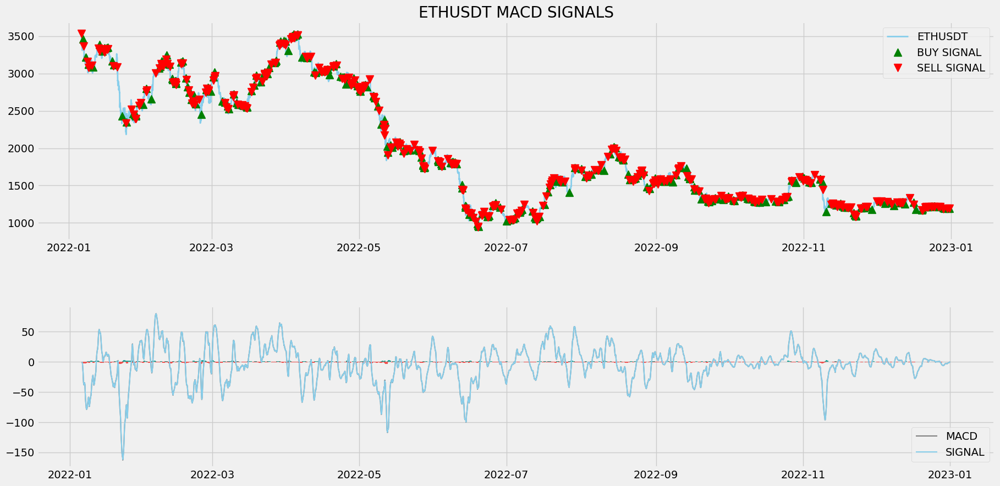

In [39]:
plot_signals_macd(ethusdt_spot_1h, ethusdt_macd, buy_price, sell_price, 'ETHUSDT')

## Futures

In [40]:
max_total_investment_ret = -10**9
max_profit_percentage = -10**9
best_params = (0, 0, 0)

for p in params:
    slow, fast, smooth = p[0], p[1], p[2]
    total_investment_ret, profit_percentage = get_best_params_macd(ethusdt_futures_1h, slow, fast, smooth, investment_value)
    if total_investment_ret > max_total_investment_ret and profit_percentage > max_profit_percentage:
        max_total_investment_ret = total_investment_ret
        max_profit_percentage = profit_percentage
        best_params = p

In [41]:
print('Profit gained from the MACD strategy by investing ${}k in ETHUSDT: {}'.format(investment_value / 1000, max_total_investment_ret))
print('Profit percentage of the MACD strategy: {}%'.format(max_profit_percentage))
print('Best params for the MACD strategy : slow={}, fast={}, smooth={}'.format(best_params[0], best_params[1], best_params[2]))

Profit gained from the MACD strategy by investing $50.0k in ETHUSDT: 9903.46
Profit percentage of the MACD strategy: 19%
Best params for the MACD strategy : slow=40, fast=30, smooth=3


In [42]:
ethusdt_macd = get_macd(ethusdt_futures_1h['close'], best_params[0], best_params[1], best_params[2])
ethusdt_macd.tail()

,macd,signal,hist
2022-12-31 20:00:00,0.293231,0.234296,0.058934
2022-12-31 21:00:00,0.309443,0.271869,0.037573
2022-12-31 22:00:00,0.372463,0.322166,0.050297
2022-12-31 23:00:00,0.422806,0.372486,0.050320
2023-01-01 00:00:00,0.429451,0.400968,0.028483


In [43]:
buy_price, sell_price, macd_signal = implement_macd_strategy(ethusdt_futures_1h['close'], ethusdt_macd)

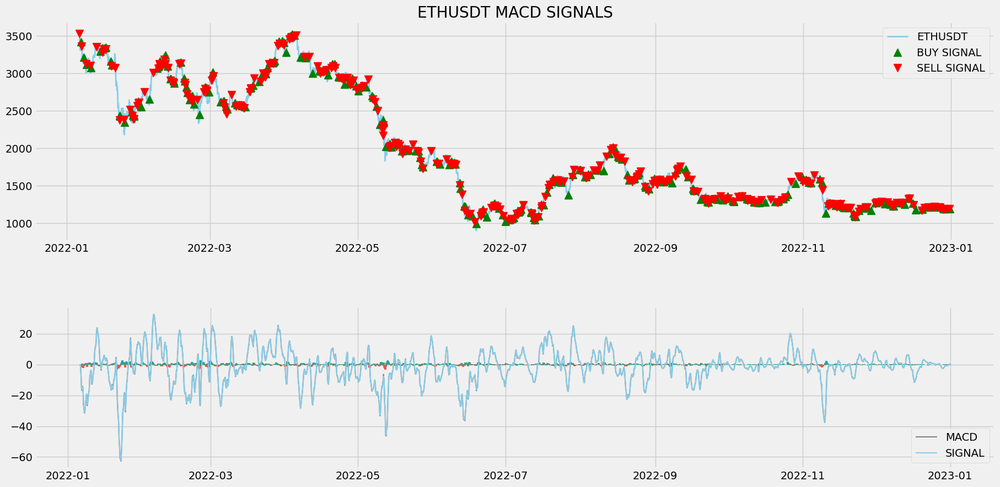

In [44]:
plot_signals_macd(ethusdt_futures_1h, ethusdt_macd, buy_price, sell_price, 'ETHUSDT')

## Bollinger Bands

In [45]:
params = [list(range(10, 1001, 5)),
          list(range(1, 7, 1))]
params = list(itertools.product(*params))

In [46]:
from scripts.bb import get_bb, implement_bb_strategy, plot_signals_bb, get_best_params_bb

## Spot

In [47]:
max_total_investment_ret = -10**9
max_profit_percentage = -10**9
best_params = (0, 0)

for p in params:
    window, std = p[0], p[1]
    total_investment_ret, profit_percentage = get_best_params_bb(ethusdt_spot_1h, window, std, 50000)
    if total_investment_ret > max_total_investment_ret and profit_percentage > max_profit_percentage:
        max_total_investment_ret = total_investment_ret
        max_profit_percentage = profit_percentage
        best_params = p

In [48]:
print('Profit gained from the BB strategy by investing ${}k in ETHUSDT: {}'.format(investment_value / 1000, max_total_investment_ret))
print('Profit percentage of the BB strategy : {}%'.format(max_profit_percentage))
print('Best params for the BB strategy : window={}, std={}'.format(best_params[0], best_params[1]))

Profit gained from the BB strategy by investing $50.0k in ETHUSDT: -10357.48
Profit percentage of the BB strategy : -21%
Best params for the BB strategy : window=125, std=6


In [49]:
ethusdt_bb = get_bb(ethusdt_spot_1h['close'], best_params[0], best_params[1])
ethusdt_bb.tail()

,sma_125,upper_bb,lower_bb
2022-12-31 20:00:00,1202.14808,1223.407981,1180.888179
2022-12-31 21:00:00,1202.01864,1223.134626,1180.902654
2022-12-31 22:00:00,1201.90504,1222.844241,1180.965839
2022-12-31 23:00:00,1201.80080,1222.593023,1181.008577
2023-01-01 00:00:00,1201.66792,1222.280243,1181.055597


In [50]:
buy_price, sell_price, bb_signal = implement_bb_strategy(ethusdt_spot_1h['close'], ethusdt_bb['lower_bb'], ethusdt_bb['upper_bb'])

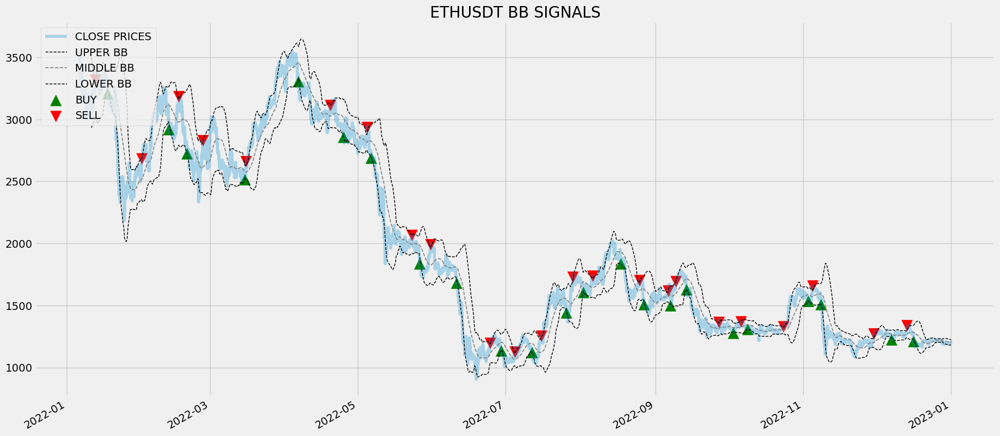

In [51]:
plot_signals_bb(ethusdt_spot_1h, ethusdt_bb, buy_price, sell_price)

## Futures

In [52]:
max_total_investment_ret = -10**9
max_profit_percentage = -10**9
best_params = (0, 0)

for p in params:
    window, std = p[0], p[1]
    total_investment_ret, profit_percentage = get_best_params_bb(ethusdt_futures_1h, window, std, 50000)
    if total_investment_ret > max_total_investment_ret and profit_percentage > max_profit_percentage:
        max_total_investment_ret = total_investment_ret
        max_profit_percentage = profit_percentage
        best_params = p

In [53]:
print('Profit gained from the BB strategy by investing ${}k in ETHUSDT: {}'.format(investment_value / 1000, max_total_investment_ret))
print('Profit percentage of the BB strategy: {}%'.format(max_profit_percentage))
print('Best params for the BB strategy : window={}, std={}'.format(best_params[0], best_params[1]))

Profit gained from the BB strategy by investing $50.0k in ETHUSDT: -10305.96
Profit percentage of the BB strategy: -21%
Best params for the BB strategy : window=125, std=6


In [54]:
ethusdt_bb = get_bb(ethusdt_futures_1h['close'], best_params[0], best_params[1])
ethusdt_bb.tail()

,sma_125,upper_bb,lower_bb
2022-12-31 20:00:00,1201.76272,1222.879248,1180.646192
2022-12-31 21:00:00,1201.63648,1222.607309,1180.665651
2022-12-31 22:00:00,1201.52688,1222.321109,1180.732651
2022-12-31 23:00:00,1201.42936,1222.083867,1180.774853
2023-01-01 00:00:00,1201.30216,1221.782715,1180.821605


In [55]:
buy_price, sell_price, bb_signal = implement_bb_strategy(ethusdt_futures_1h['close'], ethusdt_bb['lower_bb'], ethusdt_bb['upper_bb'])

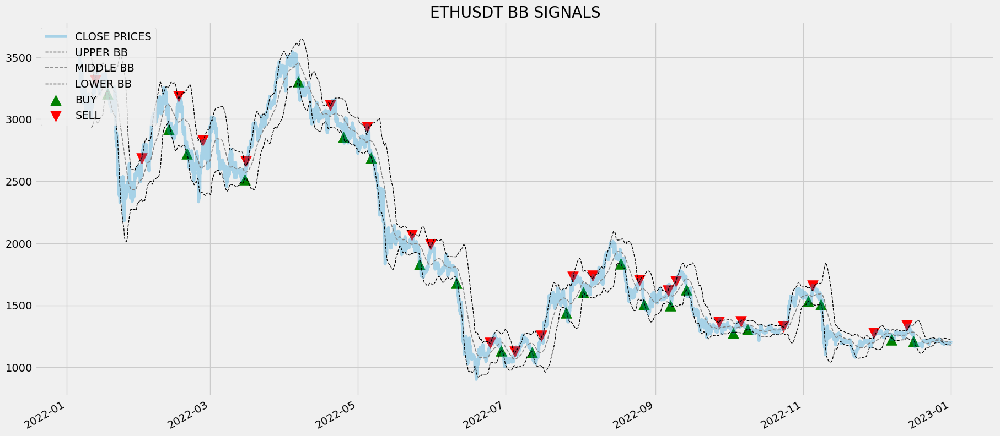

In [56]:
plot_signals_bb(ethusdt_futures_1h, ethusdt_bb, buy_price, sell_price)

## Models

In [57]:
import statsmodels.api as sm

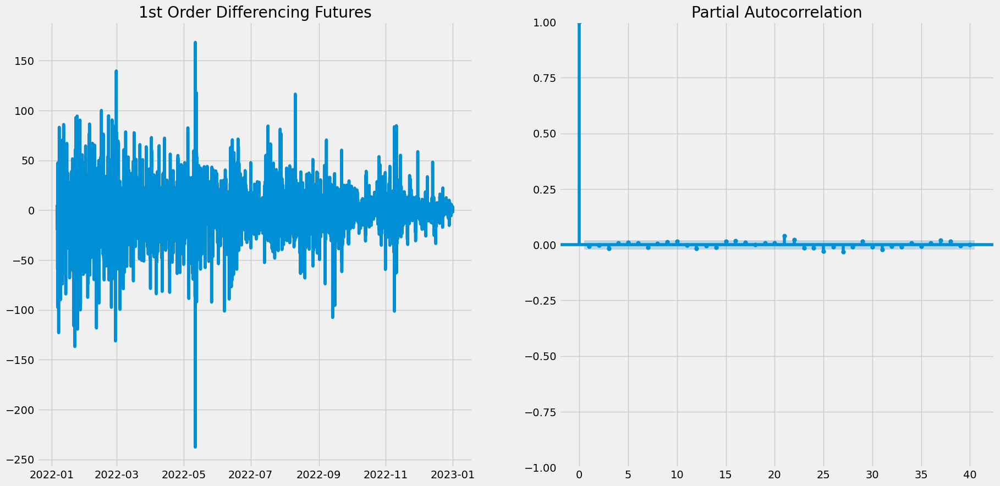

In [58]:
f = plt.figure()
ax1 = f.add_subplot(121)
ax1.set_title('1st Order Differencing Futures')
ax1.plot(ethusdt_futures_1h['close'].diff())

ax2 = f.add_subplot(122)
sm.graphics.tsa.plot_pacf(ethusdt_futures_1h['close'].diff().dropna(), ax=ax2)
plt.show()

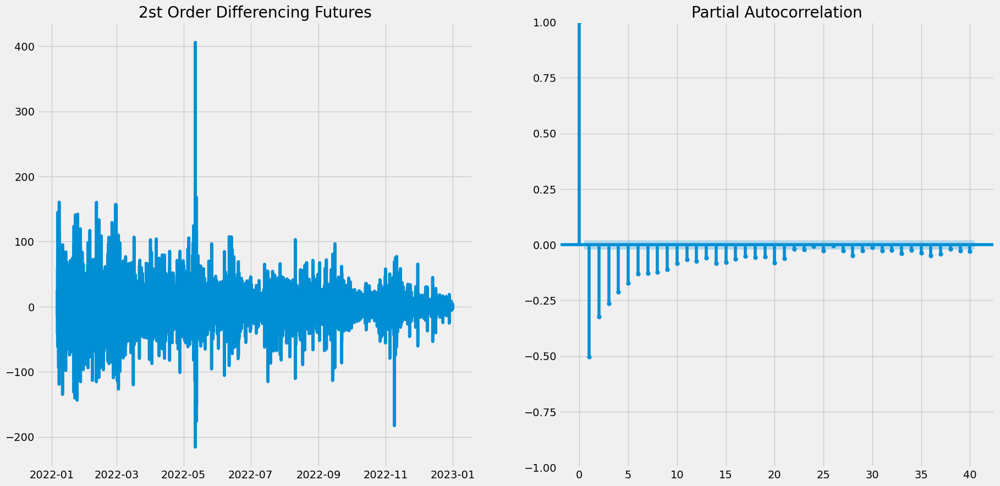

In [59]:
f = plt.figure()
ax1 = f.add_subplot(121)
ax1.set_title('2st Order Differencing Futures')
ax1.plot(ethusdt_futures_1h['close'].diff().diff())

ax2 = f.add_subplot(122)
sm.graphics.tsa.plot_pacf(ethusdt_futures_1h['close'].diff().diff().dropna(), ax=ax2)
plt.show()

In [60]:
from statsmodels.tsa.stattools import adfuller

In [61]:
print('p-Value for the Futures close prices:', round(adfuller(ethusdt_futures_1h['close'][1:])[1], 5))
print('p-Value for the Futures close return:', round(adfuller(ethusdt_futures_1h['close'].diff().dropna())[1], 7))
print('p-Value for the Futures close return:', round(adfuller(ethusdt_futures_1h['close'].diff().diff().dropna())[1], 7))

p-Value for the Futures close prices: 0.42079
p-Value for the Futures close return: 0.0
p-Value for the Futures close return: 0.0


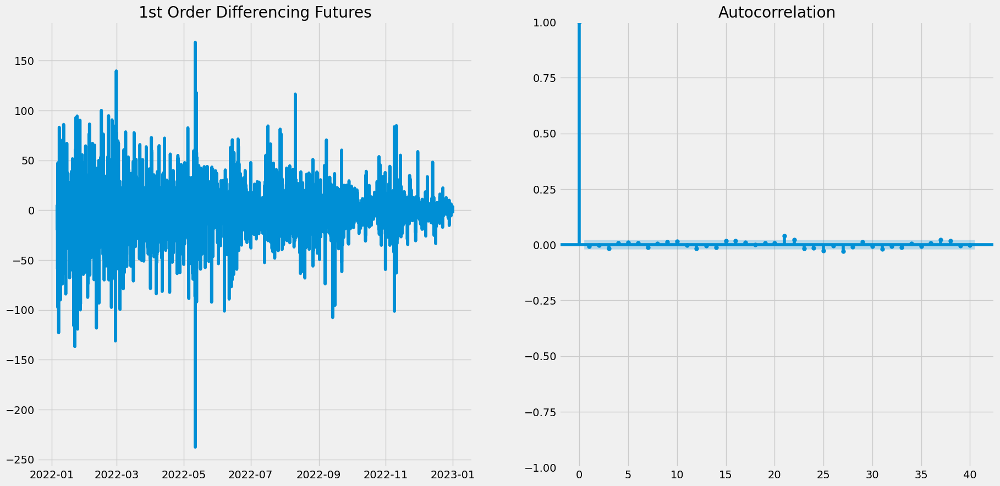

In [62]:
f = plt.figure()
ax1 = f.add_subplot(121)
ax1.set_title('1st Order Differencing Futures')
ax1.plot(ethusdt_futures_1h['close'].diff())

ax2 = f.add_subplot(122)
sm.graphics.tsa.plot_acf(ethusdt_futures_1h['close'].diff().dropna(), ax=ax2)
plt.show()

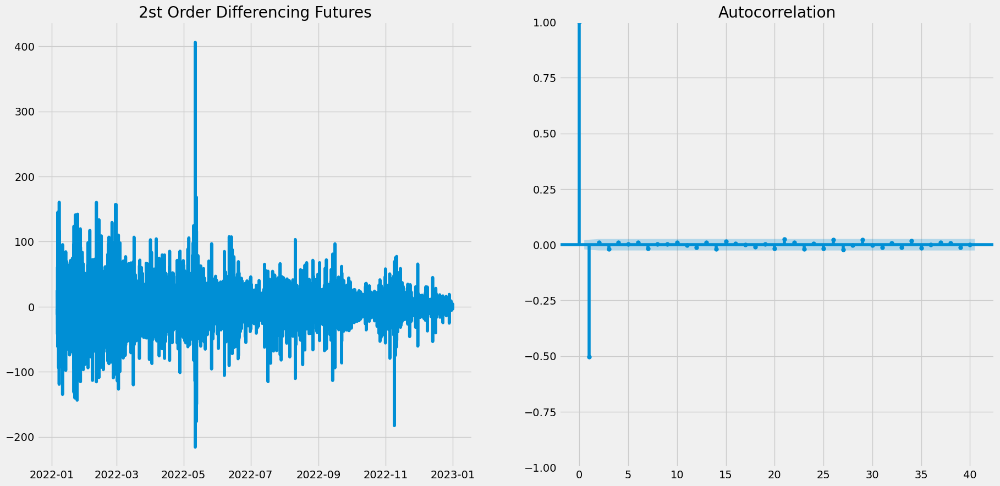

In [63]:
f = plt.figure()
ax1 = f.add_subplot(121)
ax1.set_title('2st Order Differencing Futures')
ax1.plot(ethusdt_futures_1h['close'].diff().diff())

ax2 = f.add_subplot(122)
sm.graphics.tsa.plot_acf(ethusdt_futures_1h['close'].diff().diff().dropna(), ax=ax2)
plt.show()

## Prepare data

In [64]:
date_unique = np.unique([str(datetime).split(" ")[0] for datetime in ethusdt_futures_1h.index])
treshold = date_unique[:int(np.round(len(date_unique) * 0.8 + 2.01))][-1]

In [65]:
train = ethusdt_futures_1h[ethusdt_futures_1h.index < pd.to_datetime(treshold, format='%Y-%m-%d')]
test = ethusdt_futures_1h[ethusdt_futures_1h.index >= pd.to_datetime(treshold, format='%Y-%m-%d')]

In [66]:
train.shape

(6974, 5)

In [67]:
test.shape

(1684, 5)

## Time series forecast

In [68]:
import math
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, r2_score, mean_squared_error

In [69]:
y = train['close']

In [70]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.arima.model import ARIMA

In [71]:
params = params = [list(range(0, 4, 1)),
                   list(range(0, 4, 1)),
                   list(range(0, 4, 1))]
params = list(itertools.product(*params))

In [72]:
preds_SARIMAX = []
best_MSE_SARIMAX = 10**9
best_params_SARIMAX = (0, 0, 0)
model_SARIMAX = None

for p in params:
    m = SARIMAX(y, order=p)
    m = m.fit()
    y_pred = m.get_forecast(len(test.index))
    y_pred_df = y_pred.conf_int(alpha = 0.05) 
    y_pred_df[f"Predictions_SARIMAX"] = m.predict(start=y_pred_df.index[0], end=y_pred_df.index[-1])
    y_pred_df.index = test.index
    mse = mean_squared_error(test['close'], y_pred_df[f"Predictions_SARIMAX"])
    if best_MSE_SARIMAX > mse:
        best_MSE_SARIMAX = mse
        best_params_SARIMAX = p
        preds_SARIMAX = y_pred_df[f"Predictions_SARIMAX"].to_list()
        model_SARIMAX = m

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it ha

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Predicti

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Predicti

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Predicti

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be igno

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Predicti

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Predicti

In [73]:
print("Best params for the SARIMAX model: {}".format(best_params_SARIMAX))
print("SARIMAX model best MSE: {:.3f}".format(best_MSE_SARIMAX))
print("SARIMAX model RMSE: {:.3f}".format(math.sqrt(best_MSE_SARIMAX)))
print("SARIMAX model MAE: {:.3f}".format(mean_absolute_error(test['close'], preds_SARIMAX)))
print("SARIMAX model MAPE: {:.3f}".format(mean_absolute_percentage_error(test['close'], preds_SARIMAX)))
print("SARIMAX model R^2: {:.3f}".format(r2_score(test['close'], preds_SARIMAX)))

Best params for the SARIMAX model: (2, 1, 3)
SARIMAX model best MSE: 17981.029
SARIMAX model RMSE: 134.093
SARIMAX model MAE: 88.301
SARIMAX model MAPE: 0.063
SARIMAX model R^2: 0.149


In [74]:
print(model_SARIMAX.summary())

                               SARIMAX Results                                
Dep. Variable:                  close   No. Observations:                 6974
Model:               SARIMAX(2, 2, 3)   Log Likelihood              -30634.041
Date:                Fri, 15 Sep 2023   AIC                          61280.082
Time:                        22:06:17   BIC                          61321.180
Sample:                             0   HQIC                         61294.246
                               - 6974                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.1317      0.040    -28.134      0.000      -1.211      -1.053
ar.L2         -0.9787      0.040    -24.607      0.000      -1.057      -0.901
ma.L1          0.1363      0.041      3.365      0.0

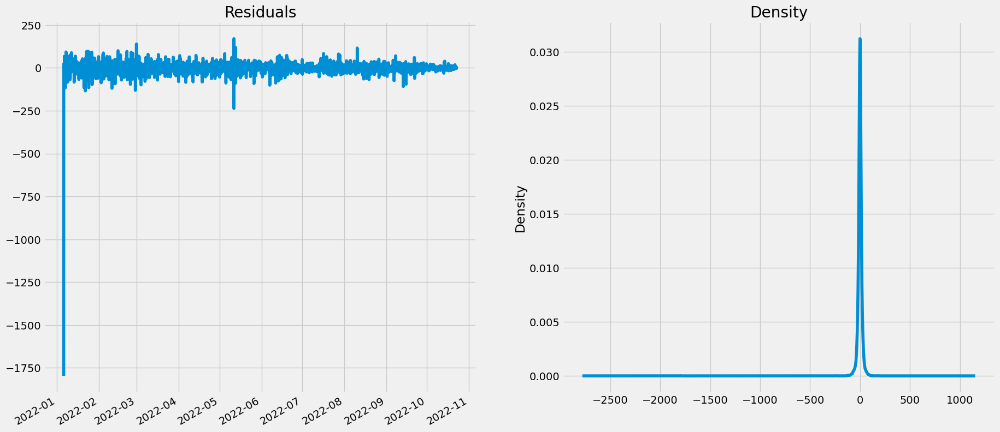

In [75]:
residuals = model_SARIMAX.resid[1:]
fig, ax = plt.subplots(1,2)
residuals.plot(title='Residuals', ax=ax[0])
residuals.plot(title='Density', kind='kde', ax=ax[1])
plt.show()

In [76]:
preds_ARIMA = []
best_MSE_ARIMA = 10**9
best_params_ARIMA = (0, 0, 0)
model_ARIMA = None

for p in params:
    m = ARIMA(y, order=p)
    m = m.fit()
    y_pred = m.get_forecast(len(test.index))
    y_pred_df = y_pred.conf_int(alpha = 0.05) 
    y_pred_df[f"Predictions_ARIMA"] = m.predict(start=y_pred_df.index[0], end=y_pred_df.index[-1])
    y_pred_df.index = test.index
    mse = mean_squared_error(test['close'], y_pred_df[f"Predictions_ARIMA"])
    if best_MSE_ARIMA > mse:
        best_MSE_ARIMA = mse
        best_params_ARIMA = p
        preds_ARIMA = y_pred_df[f"Predictions_ARIMA"].to_list()
        model_ARIMA = m

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is avai

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it ha

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it ha

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it ha

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be igno

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be igno

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is avai

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it ha

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\paxom\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be igno

In [77]:
print("Best params for the ARIMA model: {}".format(best_params_ARIMA))
print("ARIMA model best MSE: {:.3f}".format(best_MSE_ARIMA))
print("ARIMA model RMSE: {:.3f}".format(math.sqrt(best_MSE_ARIMA)))
print("ARIMA model MAE: {:.3f}".format(mean_absolute_error(test['close'], preds_ARIMA)))
print("ARIMA model MAPE: {:.3f}".format(mean_absolute_percentage_error(test['close'], preds_ARIMA)))
print("ARIMA model R^2: {:.3f}".format(r2_score(test['close'], preds_ARIMA)))

Best params for the ARIMA model: (2, 2, 3)
ARIMA model best MSE: 17789.906
ARIMA model RMSE: 133.379
ARIMA model MAE: 87.341
ARIMA model MAPE: 0.061
ARIMA model R^2: 0.153


In [78]:
print(model_ARIMA.summary())

                               SARIMAX Results                                
Dep. Variable:                  close   No. Observations:                 6974
Model:                 ARIMA(2, 2, 3)   Log Likelihood              -30634.041
Date:                Fri, 15 Sep 2023   AIC                          61280.082
Time:                        22:10:42   BIC                          61321.180
Sample:                             0   HQIC                         61294.246
                               - 6974                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.1317      0.040    -28.134      0.000      -1.211      -1.053
ar.L2         -0.9787      0.040    -24.607      0.000      -1.057      -0.901
ma.L1          0.1363      0.041      3.365      0.0

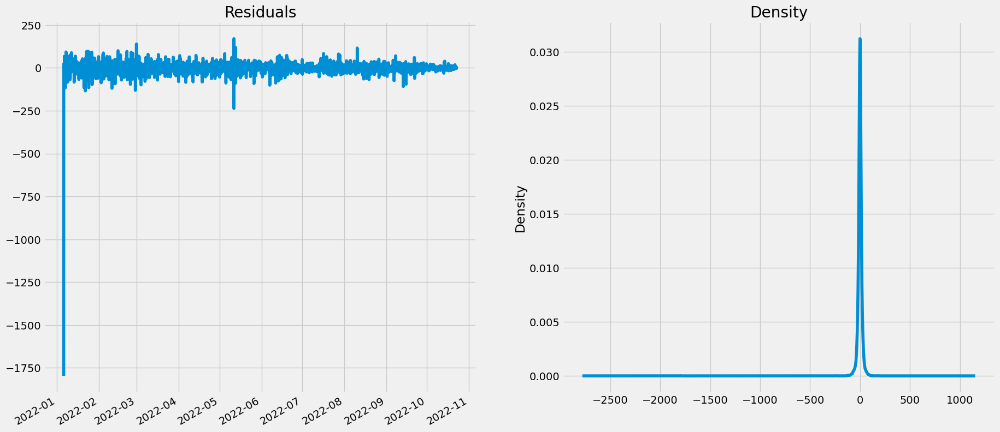

In [79]:
residuals = model_ARIMA.resid[1:]
fig, ax = plt.subplots(1,2)
residuals.plot(title='Residuals', ax=ax[0])
residuals.plot(title='Density', kind='kde', ax=ax[1])
plt.show()

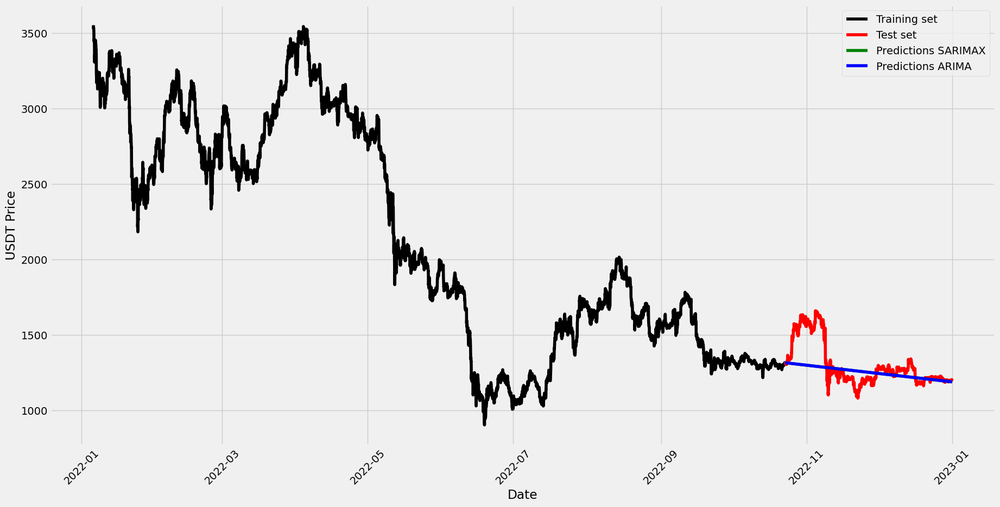

In [80]:
plt.plot(train['close'], color="black", label='Training set')
plt.plot(test['close'], color="red", label='Test set')
plt.ylabel('USDT Price')
plt.xlabel('Date')
plt.xticks(rotation=45)
# plt.title("Time Series Plot of ETHUSDT Futures Price with Training and Test Predictions. Models: SARIMAX, ARIMA")

plt.plot(test.index, preds_SARIMAX, color='green', label='Predictions SARIMAX')
plt.plot(test.index, preds_ARIMA, color='blue', label='Predictions ARIMA')
plt.legend()

plt.show()

In [81]:
from math import floor

In [82]:
number_of_stocks = floor(investment_value / train['close'][-1])
max_total_investment_ret = abs(number_of_stocks * train['close'][-1] - number_of_stocks * test['close'][-1])
max_profit_percentage = (max_total_investment_ret / (number_of_stocks * train['close'][-1])) * 100

In [83]:
print('Profit gained from the ARIMA n/ SARIMAX (Buy & Hold strategy) by investing ${}k in ETHUSDT: {}'.format(investment_value / 1000, max_total_investment_ret))
print('Profit percentage of the ARIMA n/ SARIMAX (Buy & Hold strategy): {:.3f}%'.format(max_profit_percentage))

Profit gained from the ARIMA n/ SARIMAX (Buy & Hold strategy) by investing $50.0k in ETHUSDT: 4377.600000000006
Profit percentage of the ARIMA n/ SARIMAX (Buy & Hold strategy): 8.758%


## LSTM

In [84]:
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout
from keras.layers import LSTM
# Additional
from keras.layers import Attention
from scripts import preprocessing 

In [85]:
last_value = test.iloc[[-1]]
test = test.iloc[:-1]

In [86]:
train_new = pd.concat([train, test])

In [87]:
# TAKING DIFFERENT INDICATORS FOR PREDICTION
OHLC_avg = train_new[['open', 'high', 'low', 'close']].mean(axis=1)
HLC_avg = train_new[['high', 'low', 'close']].mean(axis=1)
close_val = train_new[['close']]

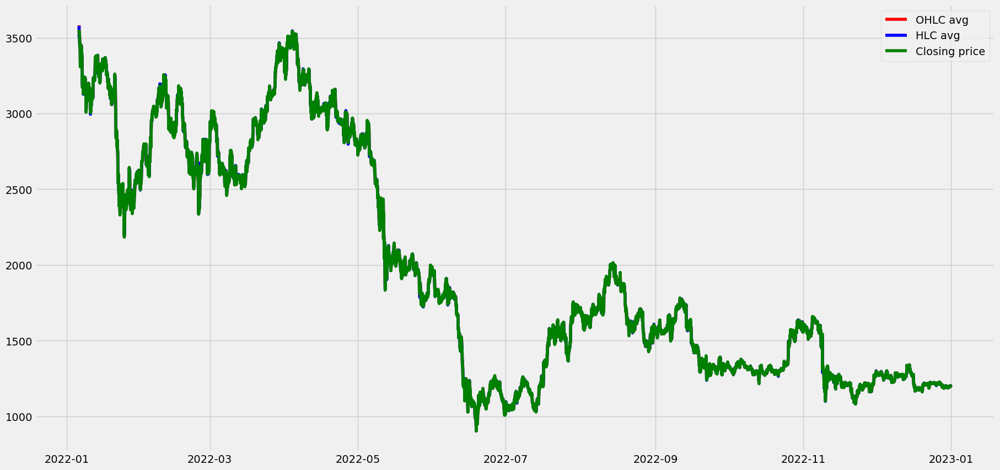

In [88]:
# PLOTTING ALL INDICATORS IN ONE PLOT
plt.plot(train_new.index, OHLC_avg, 'r', label='OHLC avg')
plt.plot(train_new.index, HLC_avg, 'b', label='HLC avg')
plt.plot(train_new.index, close_val, 'g', label='Closing price')
plt.legend(loc='upper right')
plt.show()

In [89]:
# PREPARATION OF TIME SERIES DATASE
OHLC_avg = np.reshape(OHLC_avg.values, (len(OHLC_avg),1)) # 1664
scaler = MinMaxScaler(feature_range=(0, 1))
OHLC_avg = scaler.fit_transform(OHLC_avg)

In [90]:
# TRAIN-TEST SPLIT
train_OHLC = train.shape[0]
test_OHLC = len(OHLC_avg) - train_OHLC
train_OHLC, test_OHLC = OHLC_avg[0:train_OHLC,:], OHLC_avg[train_OHLC:len(OHLC_avg),:]

In [91]:
# TIME-SERIES DATASET (FOR TIME T, VALUES FOR TIME T+1)
trainX, trainY = preprocessing.new_dataset(train_OHLC, 1)
valX, valY = preprocessing.new_dataset(test_OHLC, 1)

In [92]:
# RESHAPING TRAIN AND TEST DATA
trainX = np.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
valX = np.reshape(valX, (valX.shape[0], 1, valX.shape[1]))
step_size = 1

In [93]:
from keras.models import Sequential
from keras.layers import LSTM, Dropout, Dense, Activation, Conv1D, MaxPooling1D, Flatten

# Initialize the Sequential model
model = Sequential()

# Add a Conv1D layer
model.add(Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(1, 1), padding='same'))

# Add LSTM layers
model.add(LSTM(32, return_sequences=True))

model.add(LSTM(16))

# Add a Dense output layer
model.add(Dense(1, activation='linear'))

In [94]:
# MODEL COMPILING AND TRAINING
model.compile(loss='mean_squared_error', optimizer='adagrad') # Try SGD, adam, adagrad and compare!!!
model.fit(trainX, trainY, epochs=5, batch_size=1, verbose=2)

Epoch 1/5
6972/6972 - 25s - loss: 0.1482 - 25s/epoch - 4ms/step
Epoch 2/5
6972/6972 - 23s - loss: 0.0740 - 23s/epoch - 3ms/step
Epoch 3/5
6972/6972 - 22s - loss: 0.0611 - 22s/epoch - 3ms/step
Epoch 4/5
6972/6972 - 22s - loss: 0.0548 - 22s/epoch - 3ms/step
Epoch 5/5
6972/6972 - 22s - loss: 0.0482 - 22s/epoch - 3ms/step


In [95]:
# PREDICTION
trainPredict = model.predict(trainX)
valPredict = model.predict(valX)

53/53 [==============================] - 0s 2ms/step


In [96]:
# DE-NORMALIZING FOR PLOTTING
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
valPredict = scaler.inverse_transform(valPredict)
valY = scaler.inverse_transform([valY])

In [97]:
# TEST METRICS
print("LSTM model MSE (train): {:.3f}".format(mean_squared_error(trainY[0], trainPredict[:,0])))
print("LSTM model RMSE (train): {:.3f}".format(math.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))))
print("LSTM model MAE (train): {:.3f}".format(mean_absolute_error(trainY[0], trainPredict[:,0])))
print("LSTM model MAPE (train): {:.3f}".format(mean_absolute_percentage_error(trainY[0], trainPredict[:,0])))
print("LSTM model R^2 (train): {:.3f}".format(r2_score(trainY[0], trainPredict[:,0])))

LSTM model MSE (train): 319767.162
LSTM model RMSE (train): 565.480
LSTM model MAE (train): 522.201
LSTM model MAPE (train): 0.297
LSTM model R^2 (train): 0.435


In [98]:
# TEST METRICS
print("LSTM model MSE (val): {:.3f}".format(mean_squared_error(valY[0], valPredict[:,0])))
print("LSTM model RMSE (val): {:.3f}".format(math.sqrt(mean_squared_error(valY[0], valPredict[:,0]))))
print("LSTM model MAE (val): {:.3f}".format(mean_absolute_error(valY[0], valPredict[:,0])))
print("LSTM model MAPE (val): {:.3f}".format(mean_absolute_percentage_error(valY[0], valPredict[:,0])))
print("LSTM model R^2 (val): {:.3f}".format(r2_score(valY[0], valPredict[:,0])))

LSTM model MSE (val): 506669.537
LSTM model RMSE (val): 711.807
LSTM model MAE (val): 703.838
LSTM model MAPE (val): 0.556
LSTM model R^2 (val): -23.102


In [99]:
# ALL METRICS
print("LSTM model MSE (all): {:.3f}".format(mean_squared_error(np.concatenate((trainY[0], valY[0])),
                                                               np.concatenate((trainPredict[:,0], valPredict[:,0])))))
print("LSTM model RMSE (all): {:.3f}".format(math.sqrt(mean_squared_error(np.concatenate((trainY[0], valY[0])), 
                                                                          np.concatenate((trainPredict[:,0], valPredict[:,0]))))))
print("LSTM model MAE (all): {:.3f}".format(mean_absolute_error(np.concatenate((trainY[0], valY[0])), 
                                                                np.concatenate((trainPredict[:,0], valPredict[:,0])))))
print("LSTM model MAPE (all): {:.3f}".format(mean_absolute_percentage_error(np.concatenate((trainY[0], valY[0])), 
                                                                            np.concatenate((trainPredict[:,0], valPredict[:,0])))))
print("LSTM model R^2 (all): {:.3f}".format(r2_score(np.concatenate((trainY[0], valY[0])), 
                                                     np.concatenate((trainPredict[:,0], valPredict[:,0])))))

LSTM model MSE (all): 356076.291
LSTM model RMSE (all): 596.721
LSTM model MAE (all): 557.488
LSTM model MAPE (all): 0.347
LSTM model R^2 (all): 0.372


In [100]:
# CREATING SIMILAR DATASET TO PLOT TRAINING PREDICTIONS
trainPredictPlot = np.empty_like(OHLC_avg)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[step_size:len(trainPredict)+step_size, :] = trainPredict

In [101]:
# CREATING SIMILAR DATASSET TO PLOT TEST PREDICTIONS
valPredictPlot = np.empty_like(OHLC_avg)
valPredictPlot[:, :] = np.nan
valPredictPlot[len(trainPredict)+(step_size*2)+1:len(OHLC_avg)-1, :] = valPredict

In [102]:
# DE-NORMALIZING MAIN DATASET 
OHLC_avg = scaler.inverse_transform(OHLC_avg)

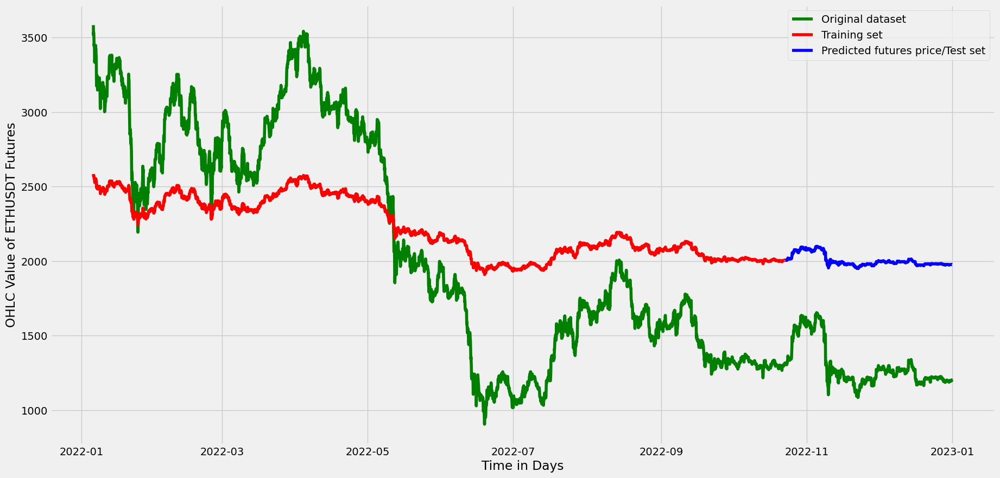

In [103]:
# PLOT OF MAIN OHLC VALUES, TRAIN PREDICTIONS AND TEST PREDICTIONS
plt.plot(train_new.index, OHLC_avg, 'g', label='Original dataset')
plt.plot(train_new.index, trainPredictPlot, 'r', label='Training set')
plt.plot(train_new.index, valPredictPlot, 'b', label='Predicted futures price/Test set')
plt.legend(loc='upper right')
plt.xlabel('Time in Days')
plt.ylabel('OHLC Value of ETHUSDT Futures')
# plt.title("Time Series Plot of ETHUSDT Futures Price with Training and Test Predictions. Model: LSTM")

plt.show()

In [104]:
# PREDICT FUTURE VALUES
last_val = valPredict[-1]
last_val_scaled = last_val/last_val
next_val = model.predict(np.reshape(last_val_scaled, (1,1,1)))
print("Last Day Value true:", test.iloc[-1]['close'])
print("Last Day Value predicted:", np.ndarray.item((last_val)))
print("Next Day Value true:", last_value['close'][0])
print("Next Day Value predicted:", np.ndarray.item(last_val*next_val))

1/1 [==============================] - 0s 31ms/step
Last Day Value true: 1202.45
Last Day Value predicted: 1977.1390380859375
Next Day Value true: 1200.11
Next Day Value predicted: 1239.56689453125


In [105]:
last_value

,open,high,low,close,volume
2023-01-01,1202.46,1203.16,1199.61,1200.11,37493.2


In [110]:
number_of_stocks = floor(investment_value / test.iloc[-1]['close'])
max_total_investment_ret = abs(number_of_stocks * test.iloc[-1]['close'] - number_of_stocks * last_value['close'][0])
max_profit_percentage = (max_total_investment_ret / (number_of_stocks * test['close'][-1])) * 100

In [111]:
print('Profit gained from the LSTM prediction by investing ${}k in ETHUSDT: {}'.format(investment_value / 1000, max_total_investment_ret))
print('Profit percentage of the LSTM prediction): {:.3f}%'.format(max_profit_percentage))

Profit gained from the LSTM prediction by investing $50.0k in ETHUSDT: 95.9400000000096
Profit percentage of the LSTM prediction): 0.195%
